# Fukushima Exploration of Census Tracts with lowest Eviction Filings

Variables to compare: Rent as a percentage of income; Employment status; Household size; Median income; Education Level; Race, etc.

In [1]:
# Import required packages
import geopandas as gpd
import pandas as pd
import folium as fm
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import re
import plotly.express as px
import kaleido

## Importing Data
So far there are four datasets getting merged: Neighborhood boundaries with polygons and names, census tract file, original eviction filing notices retrieved from LA controller's website, and the geocoded addresses.

In [2]:
# Data on neighborhoods of LA
neighborhoods = gpd.read_file('data/LA_Times_Neighborhood_Boundaries.geojson')

# Eviction Filings
evictions = pd.read_csv('data/2023_eviction_filings_final.csv')
evictions_geocode = pd.read_csv('data/evictions_geocoded.csv')


# Social Vulnerability Index Data which includes census tract polygons
svi_la = gpd.read_file('data/LACountySVI.geojson',low_memory=False,
                        dtype={
                            'FIPS|':str,
                        })

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


In [3]:
svi_la.LOCATION

0       Census Tract 1011.10, Los Angeles County, Cali...
1       Census Tract 1011.22, Los Angeles County, Cali...
2       Census Tract 1012.10, Los Angeles County, Cali...
3       Census Tract 1012.20, Los Angeles County, Cali...
4       Census Tract 1013, Los Angeles County, California
                              ...                        
2310    Census Tract 9800.15, Los Angeles County, Cali...
2311    Census Tract 9800.19, Los Angeles County, Cali...
2312    Census Tract 9800.24, Los Angeles County, Cali...
2313    Census Tract 9800.26, Los Angeles County, Cali...
2314    Census Tract 9800.31, Los Angeles County, Cali...
Name: LOCATION, Length: 2315, dtype: object

In [4]:
svi_la.columns.to_list()

['OBJECTID',
 'ST',
 'STATE',
 'ST_ABBR',
 'STCNTY',
 'COUNTY',
 'FIPS',
 'LOCATION',
 'AREA_SQMI',
 'E_TOTPOP',
 'M_TOTPOP',
 'E_HU',
 'M_HU',
 'E_HH',
 'M_HH',
 'E_POV',
 'M_POV',
 'E_UNEMP',
 'M_UNEMP',
 'E_PCI',
 'M_PCI',
 'E_NOHSDP',
 'M_NOHSDP',
 'E_AGE65',
 'M_AGE65',
 'E_AGE17',
 'M_AGE17',
 'E_DISABL',
 'M_DISABL',
 'E_SNGPNT',
 'M_SNGPNT',
 'E_MINRTY',
 'M_MINRTY',
 'E_LIMENG',
 'M_LIMENG',
 'E_MUNIT',
 'M_MUNIT',
 'E_MOBILE',
 'M_MOBILE',
 'E_CROWD',
 'M_CROWD',
 'E_NOVEH',
 'M_NOVEH',
 'E_GROUPQ',
 'M_GROUPQ',
 'EP_POV',
 'MP_POV',
 'EP_UNEMP',
 'MP_UNEMP',
 'EP_PCI',
 'MP_PCI',
 'geometry']

## Eviction Data
### Merge Eviction and geocoded data

Here I prep the eviction files for merging. I change the names of the columns to match each other and make sure they're strings.

I don't merge on a column because the index of each dataframe remain identical from the geocoding process, and the shape of each dataframe don't match given the number of available addresses.

In [5]:
# Convert evictions 'Address' to string
evictions['Address'] = evictions['Address'].astype(str)

# Create new column in evictions_geocode with matching name 'Address' and make sure it's a string
evictions_geocode['Address'] = evictions_geocode['input_string'].astype(str)


In [6]:
print(evictions['Address']), print(evictions_geocode['Address'])

0          7367 Hollywood Blvd, Los Angeles, 90046
1          7367 Hollywood Blvd, Los Angeles, 90046
2          7367 Hollywood Blvd, Los Angeles, 90046
3          7367 Hollywood Blvd, Los Angeles, 90046
4          7367 Hollywood Blvd, Los Angeles, 90046
                           ...                    
77086            3191 W 7TH ST, Los Angeles, 90005
77087            3191 W 7TH ST, Los Angeles, 90005
77088    11049 W MAGNOLIA BLVD, Los Angeles, 91601
77089    11049 W MAGNOLIA BLVD, Los Angeles, 91601
77090       8555 S EMERSON AVE, Los Angeles, 90045
Name: Address, Length: 77091, dtype: object
0          7367 Hollywood Blvd, Los Angeles, 90046
1          7367 Hollywood Blvd, Los Angeles, 90046
2          7367 Hollywood Blvd, Los Angeles, 90046
3          7367 Hollywood Blvd, Los Angeles, 90046
4          7367 Hollywood Blvd, Los Angeles, 90046
                           ...                    
77086            3191 W 7TH ST, Los Angeles, 90005
77087            3191 W 7TH ST, Los An

(None, None)

In [7]:
# Merge the two dataframes 
evictions_matched = evictions_geocode.merge(evictions,left_index=True,right_index=True)

Let's check the work

In [8]:
evictions_matched = evictions_matched.dropna(subset='latitude')

In [9]:
evictions_matched.shape

(76760, 22)

### Process the matched file


In [10]:
evic_geo_match = gpd.GeoDataFrame(evictions_matched,geometry=gpd.points_from_xy(evictions_matched['longitude'],evictions_matched['latitude']),crs='4326')

Just another double-check that things are going ok.

In [53]:
evic_geo_match.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 76747 entries, 0 to 77090
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   formatted_address  76747 non-null  object  
 1   latitude           76747 non-null  float64 
 2   longitude          76747 non-null  float64 
 3   type               76747 non-null  object  
 4   postcode           76445 non-null  float64 
 5   Cause              76745 non-null  object  
 6   geometry           76747 non-null  geometry
dtypes: float64(3), geometry(1), object(3)
memory usage: 4.7+ MB


Let's convert the Notice Date column to datetime to be able to manipulate it easier.

Below I want to get the addresses and the number of filings at each address and store it as a string.

In [12]:
address_count = evic_geo_match.value_counts('formatted_address').reset_index(name='count')
address_count['formatted_address'] = address_count['formatted_address'].astype(str)

In [13]:
address_count

,formatted_address,count
0,"325 W Adams Blvd, Los Angeles, CA 90007, USA",993
1,"123 S Figueroa St, Los Angeles, CA 90012, USA",621
2,"1600 Vine St, Los Angeles, CA 90028, USA",533
3,"21201 Kittridge St, Woodland Hills, CA 91303, USA",329
4,"600 S Spring St, Los Angeles, CA 90014, USA",314
...,...,...
13656,"409 56th St, Los Angeles, CA 90011, USA",1
13657,"4084 S Muirfield Rd, Los Angeles, CA 90008, USA",1
13658,"1394 Midvale Ave, Los Angeles, CA 90024, USA",1
13659,"4079 Abourne Rd a, Los Angeles, CA 90008, USA",1


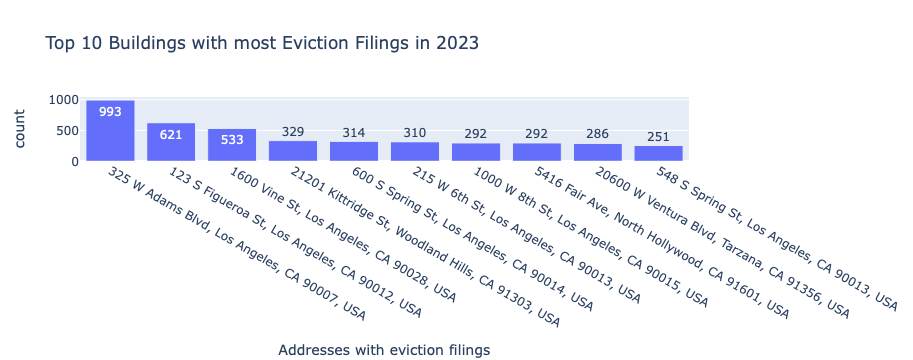

In [14]:
# I'm interested in seeing if there are particular buildings with high rates of evictions
fig = px.bar(
    address_count.head(10),
    x='formatted_address',
    y='count',
    title='Top 10 Buildings with most Eviction Filings in 2023',
    labels={
        'formatted_address':'Addresses with eviction filings'
    },
    text='count'
)
fig.show()

I found this [article](https://www.latimes.com/california/story/2023-09-07/over-40-000-eviction-notices-have-gone-out-in-la-this-year-many-to-upscale-apartments) after I did all of this work and got sad, but at least I can do a few newer things. Not sure what happened with 325 w Adams Blvd but does not seem like an accurate count given that the article cites the address as having closer to ~300.

For now I want to plot the evictions over time. So I'll convert Notice Date to datetime to be able to manipulate it easier.

In [15]:
evic_geo_match['notice_date_dt'] = pd.to_datetime(evic_geo_match['Notice Date'], format='%m/%d/%y')
evic_geo_match['notice_date_dt']

0       2023-02-03
1       2023-02-03
2       2023-02-03
3       2023-02-03
4       2023-02-03
           ...    
77086   2023-12-07
77087   2023-12-07
77088   2023-10-17
77089   2023-04-14
77090   2023-11-01
Name: notice_date_dt, Length: 76760, dtype: datetime64[ns]

In [16]:
evic_geo_match['notice_date_dt'], evic_geo_match['Notice Date']

(0       2023-02-03
 1       2023-02-03
 2       2023-02-03
 3       2023-02-03
 4       2023-02-03
            ...    
 77086   2023-12-07
 77087   2023-12-07
 77088   2023-10-17
 77089   2023-04-14
 77090   2023-11-01
 Name: notice_date_dt, Length: 76760, dtype: datetime64[ns],
 0          2/3/23
 1          2/3/23
 2          2/3/23
 3          2/3/23
 4          2/3/23
            ...   
 77086     12/7/23
 77087     12/7/23
 77088    10/17/23
 77089     4/14/23
 77090     11/1/23
 Name: Notice Date, Length: 76760, dtype: object)

In [17]:
evic_geo_match = evic_geo_match[evic_geo_match['notice_date_dt'].dt.year >= 2023 ]
evic_geo_match['notice_date_dt'].max(), evic_geo_match['notice_date_dt'].min()

(Timestamp('2023-12-31 00:00:00'), Timestamp('2023-01-01 00:00:00'))

In [18]:
address_count_grpd = evic_geo_match.value_counts(['notice_date_dt']).reset_index(name='count')
address_count_grpd

,notice_date_dt,count
0,2023-03-08,1638
1,2023-04-05,1611
2,2023-04-06,1548
3,2023-05-04,1483
4,2023-04-07,1442
...,...,...
341,2023-12-25,1
342,2023-01-09,1
343,2023-01-08,1
344,2023-01-06,1


In [19]:
address_count_grpd_june = address_count_grpd[address_count_grpd['notice_date_dt'].dt.month == 6]
address_count_grpd_june

,notice_date_dt,count
5,2023-06-06,1405
10,2023-06-07,1169
21,2023-06-05,910
38,2023-06-08,606
54,2023-06-13,453
58,2023-06-09,433
65,2023-06-02,369
70,2023-06-14,316
83,2023-06-15,249
91,2023-06-12,235


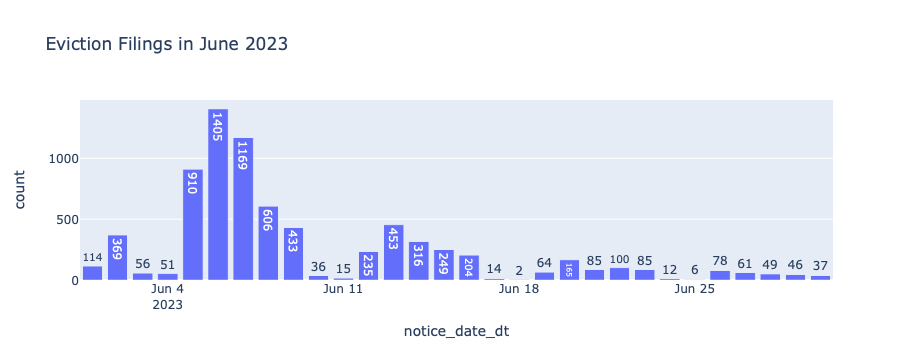

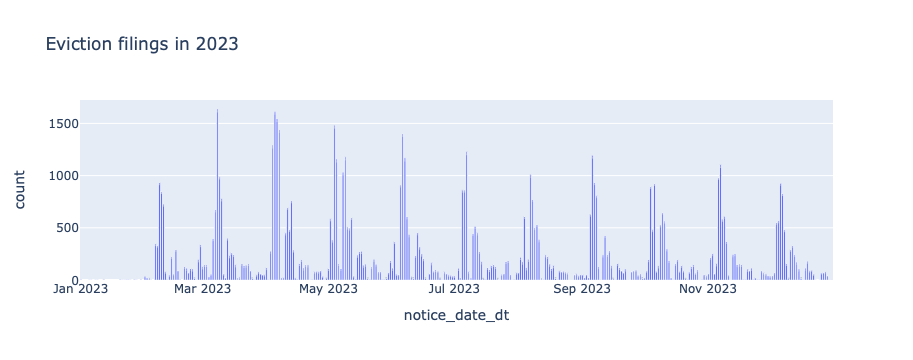

(None, None)

In [20]:
# a simple bar chart, putting date on the x-axis
fig_date_june = px.bar(
    address_count_grpd_june,
    x='notice_date_dt',
    y='count',
    text='count',
    title='Eviction Filings in June 2023'
)

fig_date_year = px.bar(
    address_count_grpd,
    x = 'notice_date_dt',
    y='count',
    text='count',
    title='Eviction filings in 2023'
)
fig_date_june.show(),fig_date_year.show()

Seems like most filings happen in the beginning of the month. There's also a weird decrease over the year with each month for some reason. 

## Process Census tract and neighborhood files

### Peep the data

In [21]:
neighborhoods.shape
neighborhoods.columns

Index(['OBJECTID', 'name', 'geometry'], dtype='object')

<Axes: >

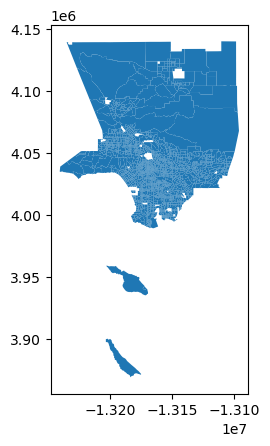

In [22]:
svi_la.plot()

In [23]:
svi_la.shape

(2315, 52)

In [24]:
svi_la = svi_la.to_crs(4326)

In [25]:
svi_census_neigh = svi_la.sjoin(neighborhoods, how='left')
svi_census_neigh.FIPS.value_counts()

FIPS
06037980010    6
06037262200    5
06037187102    5
06037269000    5
06037132700    5
              ..
06037403600    1
06037403500    1
06037403408    1
06037403407    1
06037404302    1
Name: count, Length: 2315, dtype: int64

In [26]:
svi_census_neigh = svi_census_neigh.drop_duplicates(subset='FIPS')
svi_census_neigh.shape

(2315, 55)

## Pick Columns

In [27]:
svi_census_neigh = svi_census_neigh[[
 'geometry',
 'FIPS',
 'name',
 'LOCATION',
 'AREA_SQMI',
 'E_TOTPOP',
 'E_HU',
 'E_HH',
 'E_POV',
 'E_UNEMP',
 'E_PCI',
 'E_NOHSDP',
 'E_AGE65',
 'E_AGE17',
 'E_DISABL',
 'E_SNGPNT',
 'E_MINRTY',
 'E_LIMENG',
 'E_MUNIT',
 'E_MOBILE',
 'E_CROWD',
 'E_NOVEH',
 'E_GROUPQ',
 'EP_POV',
 'EP_UNEMP',
 'EP_PCI',
]].copy()

svi_census_neigh = svi_census_neigh.rename(columns={
 'LOCATION':'location',
 'AREA_SQMI':'area_sqmile',
 'E_TOTPOP':'total_pop',
 'E_HU':'housing_units',
 'E_HH':'households',
 'E_POV':'pct_below150',
 'E_UNEMP':'unemployed',
 'E_PCI':'cost_burdened_low_income',
 'E_NOHSDP':'no_high_school',
 'E_AGE65':'persons_over65',
 'E_AGE17':'persons_under17',
 'E_DISABL':'disabled_pop',
 'E_SNGPNT':'single_parent',
 'E_MINRTY':'minority_pop',
 'E_LIMENG':'limited_eng',
 'E_MUNIT':'10_units_plus',
 'E_MOBILE':'mobile_homes',
 'E_CROWD':'crowded_units',
 'E_NOVEH':'no_vehicle',
 'E_GROUPQ':'persons_group_quarters',
 'EP_POV':'pct_pov',
 'EP_UNEMP':'pct_unemp',
 'EP_PCI':'pct_cost_burdened_low_income',
})
svi_census_neigh.head()

,geometry,FIPS,name,location,area_sqmile,total_pop,housing_units,households,pct_below150,unemployed,...,minority_pop,limited_eng,10_units_plus,mobile_homes,crowded_units,no_vehicle,persons_group_quarters,pct_pov,pct_unemp,pct_cost_burdened_low_income
0,"POLYGON ((-118.30077 34.25961, -118.30077 34.2...",06037101110,Tujunga,"Census Tract 1011.10, Los Angeles County, Cali...",0.441084,4314,1743,1596,679,166,...,1798,425,220,29,82,123,95,16.1,7.7,26996
1,"POLYGON ((-118.30321 34.27334, -118.29971 34.2...",06037101122,Sunland,"Census Tract 1011.22, Los Angeles County, Cali...",1.020871,3239,1391,1256,109,94,...,484,127,0,0,62,7,5,3.4,4.6,46974
2,"POLYGON ((-118.29946 34.25598, -118.29106 34.2...",06037101210,Tujunga,"Census Tract 1012.10, Los Angeles County, Cali...",0.251233,6052,2402,2321,1994,321,...,3061,1032,1425,0,285,287,65,33.0,10.1,19902
3,"POLYGON ((-118.28594 34.25228, -118.28594 34.2...",06037101220,Tujunga,"Census Tract 1012.20, Los Angeles County, Cali...",0.269841,3497,1328,1294,524,132,...,1803,647,339,0,152,113,0,15.0,7.8,21844
4,"POLYGON ((-118.27824 34.25166, -118.27693 34.2...",06037101300,Shadow Hills,"Census Tract 1013, Los Angeles County, California",0.996612,4297,1584,1435,391,125,...,794,194,36,7,34,66,47,9.2,5.7,35120


Now time to map some things! First a folium map looking at the number of people per census tract that pay more than 35% of the income on gross rent. 

## Map cost-burdened houses with less than $75k annual income 

In [28]:
    m2 = fm.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='CartoDB positron', 
               attribution='CartoDB')
    # plot chorpleth over the base map
    fm.Choropleth(
        geo_data=svi_census_neigh, # geo data
        data=svi_census_neigh, # data          
        key_on='feature.properties.FIPS', # key, or merge column
        columns=['FIPS', 'cost_burdened_low_income'], # [key, value]
        fill_color='BuPu',
        nan_fill_color='grey',
        nan_fill_opacity=0.4,
        line_weight=0.1, 
        fill_opacity=0.8,
        line_opacity=0.2,
    ).add_to(m2) 
m2.save('cost_burdened_low_income.html')
m2

## Trim Eviction Data

Here we'll trim eviction data to certain columns and find the different causes for eviction

In [29]:
evic_geo_match = evic_geo_match[[
    'formatted_address',
    'latitude',
    'longitude',
    'type',
    'postcode',
    'Cause',
    'geometry'
]]
evic_geo_match.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 76747 entries, 0 to 77090
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   formatted_address  76747 non-null  object  
 1   latitude           76747 non-null  float64 
 2   longitude          76747 non-null  float64 
 3   type               76747 non-null  object  
 4   postcode           76445 non-null  float64 
 5   Cause              76745 non-null  object  
 6   geometry           76747 non-null  geometry
dtypes: float64(3), geometry(1), object(3)
memory usage: 4.7+ MB


In [30]:
evic_geo_match.Cause.value_counts()

Cause
Non-payment of rent                                                                                                                                                                                                                                            72126
Violation of the rental agreement or lease                                                                                                                                                                                                                      1460
Non-payment of rent, Violation of the rental agreement or lease                                                                                                                                                                                                  915
Violation of the rental agreement or lease, Disorderly behavior/disturbing the peace (Nuisance)                                                                                                                    

In [31]:
evic_geo_match['Cause'].fillna(False)
evic_geo_vio = evic_geo_match[evic_geo_match['Cause'].str.fullmatch('Violation of the rental agreement or lease', na=False)]
evic_geo_vio

,formatted_address,latitude,longitude,type,postcode,Cause,geometry
28,"10127 Tujunga Canyon Blvd, Tujunga, CA 91042, USA",34.249981,-118.287540,premise,91042.0,Violation of the rental agreement or lease,POINT (-118.28754 34.24998)
42,"1036 E O St, Wilmington, CA 90744, USA",33.792182,-118.249713,street_address,90744.0,Violation of the rental agreement or lease,POINT (-118.24971 33.79218)
2789,"1308 N Poinsettia Pl, Los Angeles, CA 90046, USA",34.094746,-118.347998,premise,90046.0,Violation of the rental agreement or lease,POINT (-118.34800 34.09475)
3023,"12848 Bloomfield St, Studio City, CA 91604, USA",34.148975,-118.413236,premise,91604.0,Violation of the rental agreement or lease,POINT (-118.41324 34.14898)
3024,"7107 Etiwanda Ave, Reseda, CA 91335, USA",34.199568,-118.531964,premise,91335.0,Violation of the rental agreement or lease,POINT (-118.53196 34.19957)
...,...,...,...,...,...,...,...
76992,"16141 Vanowen St, Lake Balboa, CA 91406, USA",34.194357,-118.485265,premise,91406.0,Violation of the rental agreement or lease,POINT (-118.48526 34.19436)
77052,"1642 W 220th St, Torrance, CA 90501, USA",33.827692,-118.307955,premise,90501.0,Violation of the rental agreement or lease,POINT (-118.30796 33.82769)
77056,"6613 S Crenshaw Blvd, Los Angeles, CA 90043, USA",33.979177,-118.331175,street_address,90043.0,Violation of the rental agreement or lease,POINT (-118.33117 33.97918)
77070,"W Sherman Way, Los Angeles, CA 91335, USA",34.200951,-118.523158,route,91335.0,Violation of the rental agreement or lease,POINT (-118.52316 34.20095)


## Map evictions based on violation of rental agreement as listed cause

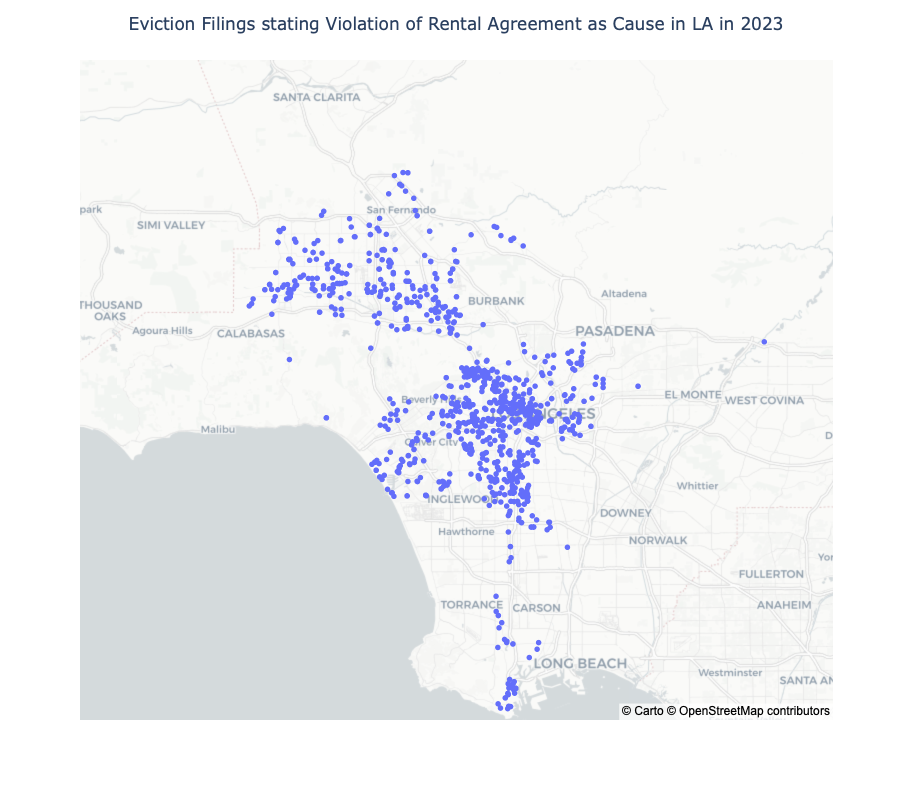

In [32]:
fig = px.scatter_mapbox(
    evic_geo_vio,
    lat='latitude',
    lon='longitude',
    mapbox_style="carto-positron",
    labels={'Cause':'Violation of the rental agreement or lease'},
    zoom=9
)

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Eviction Filings stating Violation of Rental Agreement as Cause in LA in 2023",
    title_x=0.5 # aligns title to center
)
fig.write_image('violationrental.png')
fig.show()


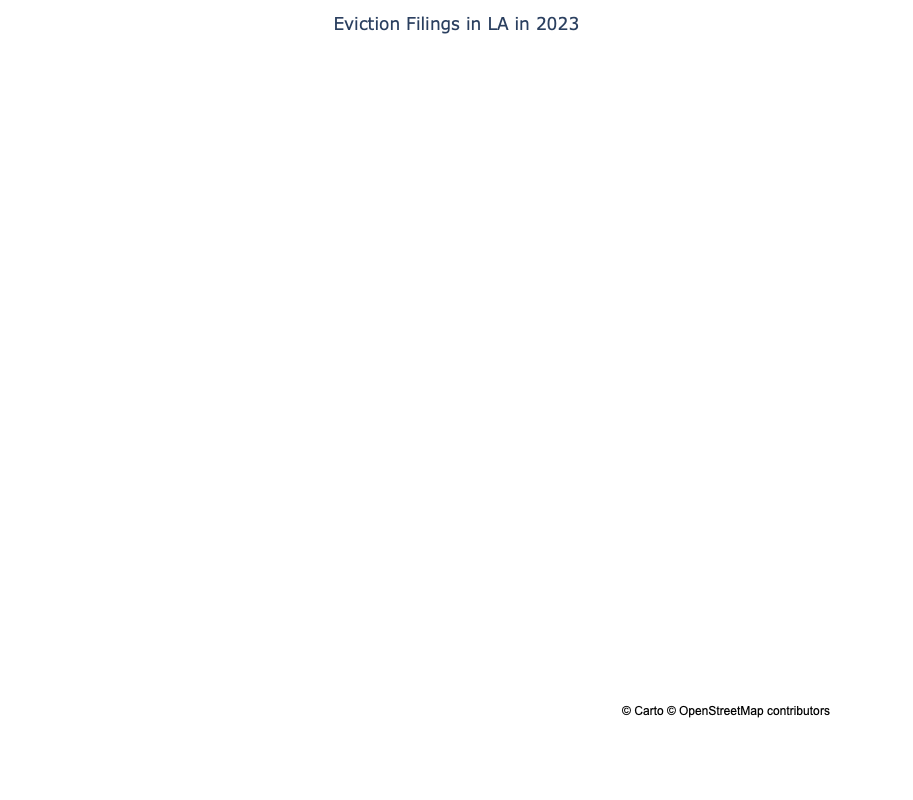

In [33]:
fig2 = px.scatter_mapbox(
    evic_geo_match,
    lat='latitude',
    lon='longitude',
    mapbox_style="carto-positron",
)

# options on the layout
fig2.update_layout(
    width = 800,
    height = 800,
    title = "Eviction Filings in LA in 2023",
    title_x=0.5 # aligns title to center
)

## Create a new dataframe for evictions 

The new dataframe combines all the filings by address and create a new column for count

In [34]:
address_ct = evic_geo_match['formatted_address'].value_counts().reset_index(name='count')
address_df = address_ct.merge(evic_geo_match,how='left',on='formatted_address')
address_df = address_df.drop_duplicates(subset='formatted_address')
address_df.formatted_address.value_counts()

formatted_address
325 W Adams Blvd, Los Angeles, CA 90007, USA        1
1647 W Adams Blvd, Los Angeles, CA 90007, USA       1
1143 W Kensington Rd, Los Angeles, CA 90026, USA    1
823 W 43rd St, Los Angeles, CA 90037, USA           1
327 W D St, Wilmington, CA 90744, USA               1
                                                   ..
13751 W Oxnard St, Van Nuys, CA 91401, USA          1
1841 Redondo Blvd, Los Angeles, CA 90019, USA       1
1032 N Berendo St, Los Angeles, CA 90029, USA       1
1545 W 206th St, Torrance, CA 90501, USA            1
1411 Armacost Ave, Los Angeles, CA 90025, USA       1
Name: count, Length: 13656, dtype: int64

In [35]:
address_df = gpd.GeoDataFrame(address_df, geometry='geometry')
address_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 13656 entries, 0 to 76746
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   formatted_address  13656 non-null  object  
 1   count              13656 non-null  int64   
 2   latitude           13656 non-null  float64 
 3   longitude          13656 non-null  float64 
 4   type               13656 non-null  object  
 5   postcode           13632 non-null  float64 
 6   Cause              13654 non-null  object  
 7   geometry           13656 non-null  geometry
dtypes: float64(3), geometry(1), int64(1), object(3)
memory usage: 960.2+ KB


In [36]:
svi_census_neigh.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2315 entries, 0 to 2314
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   geometry                      2315 non-null   geometry
 1   FIPS                          2315 non-null   object  
 2   name                          1139 non-null   object  
 3   location                      2315 non-null   object  
 4   area_sqmile                   2315 non-null   float64 
 5   total_pop                     2315 non-null   int64   
 6   housing_units                 2315 non-null   int64   
 7   households                    2315 non-null   int64   
 8   pct_below150                  2315 non-null   int64   
 9   unemployed                    2315 non-null   int64   
 10  cost_burdened_low_income      2315 non-null   int64   
 11  no_high_school                2315 non-null   int64   
 12  persons_over65                2315 non-null  

## Join the census tract data with the eviction data

In [37]:
evictions_address = address_df.sjoin(svi_census_neigh,how='right')
evictions_address.columns.to_list()

['index_left',
 'formatted_address',
 'count',
 'latitude',
 'longitude',
 'type',
 'postcode',
 'Cause',
 'geometry',
 'FIPS',
 'name',
 'location',
 'area_sqmile',
 'total_pop',
 'housing_units',
 'households',
 'pct_below150',
 'unemployed',
 'cost_burdened_low_income',
 'no_high_school',
 'persons_over65',
 'persons_under17',
 'disabled_pop',
 'single_parent',
 'minority_pop',
 'limited_eng',
 '10_units_plus',
 'mobile_homes',
 'crowded_units',
 'no_vehicle',
 'persons_group_quarters',
 'pct_pov',
 'pct_unemp',
 'pct_cost_burdened_low_income']

In [38]:
evictions_address.geometry

0       POLYGON ((-118.30077 34.25961, -118.30077 34.2...
0       POLYGON ((-118.30077 34.25961, -118.30077 34.2...
1       POLYGON ((-118.30321 34.27334, -118.29971 34.2...
1       POLYGON ((-118.30321 34.27334, -118.29971 34.2...
1       POLYGON ((-118.30321 34.27334, -118.29971 34.2...
                              ...                        
2310    POLYGON ((-118.30885 33.77262, -118.30894 33.7...
2311    POLYGON ((-118.59806 34.07622, -118.59564 34.0...
2312    POLYGON ((-118.51850 34.18499, -118.51849 34.1...
2313    POLYGON ((-118.35174 34.28248, -118.32684 34.2...
2314    POLYGON ((-118.29106 33.75378, -118.29051 33.7...
Name: geometry, Length: 14916, dtype: geometry

In [39]:
evictions_address=evictions_address.drop_duplicates(subset = 'formatted_address')
evictions_address.formatted_address = evictions_address.formatted_address.astype(str)

## Create new dataframe the counts all the evictions per census tract

In [40]:
census_evic_counts = evictions_address.groupby('FIPS').agg({
 'formatted_address':', '.join,
 'count':'sum',
 'postcode':'first',
 'geometry':'first',
 'name':'first',
 'location':'first',
 'area_sqmile':'first',
 'total_pop':'first',
 'housing_units':'first',
 'households':'first',
 'pct_below150':'first',
 'unemployed':'first',
 'cost_burdened_low_income':'first',
 'no_high_school':'first',
 'persons_over65':'first',
 'persons_under17':'first',
 'disabled_pop':'first',
 'single_parent':'first',
 'minority_pop':'first',
 'limited_eng':'first',
 '10_units_plus':'first',
 'mobile_homes':'first',
 'crowded_units':'first',
 'no_vehicle':'first',
 'persons_group_quarters':'first',
 'pct_pov':'first',
 'pct_unemp':'first',
 'pct_cost_burdened_low_income':'first'
}).reset_index()


In [41]:
census_evic_counts.head()


,FIPS,formatted_address,count,postcode,geometry,name,location,area_sqmile,total_pop,housing_units,...,minority_pop,limited_eng,10_units_plus,mobile_homes,crowded_units,no_vehicle,persons_group_quarters,pct_pov,pct_unemp,pct_cost_burdened_low_income
0,06037101110,"10346 Commerce Ave, Tujunga, CA 91042, USA, 10...",3.0,91042.0,"POLYGON ((-118.30077 34.25961, -118.30077 34.2...",Tujunga,"Census Tract 1011.10, Los Angeles County, Cali...",0.441084,4314,1743,...,1798,425,220,29,82,123,95,16.1,7.7,26996
1,06037101122,"11474 Dellmont Dr, Tujunga, CA 91042, USA, 106...",6.0,91042.0,"POLYGON ((-118.30321 34.27334, -118.29971 34.2...",Sunland,"Census Tract 1011.22, Los Angeles County, Cali...",1.020871,3239,1391,...,484,127,0,0,62,7,5,3.4,4.6,46974
2,06037101210,"10240 Commerce Ave, Tujunga, CA 91042, USA, 10...",39.0,91042.0,"POLYGON ((-118.29946 34.25598, -118.29106 34.2...",Tujunga,"Census Tract 1012.10, Los Angeles County, Cali...",0.251233,6052,2402,...,3061,1032,1425,0,285,287,65,33.0,10.1,19902
3,06037101220,"10043 Haines Canyon Ave, Tujunga, CA 91042, US...",12.0,91042.0,"POLYGON ((-118.28594 34.25228, -118.28594 34.2...",Tujunga,"Census Tract 1012.20, Los Angeles County, Cali...",0.269841,3497,1328,...,1803,647,339,0,152,113,0,15.0,7.8,21844
4,06037101300,"11886 W Foothill Blvd, Tujunga, CA 91042, USA,...",25.0,91042.0,"POLYGON ((-118.27824 34.25166, -118.27693 34.2...",Shadow Hills,"Census Tract 1013, Los Angeles County, California",0.996612,4297,1584,...,794,194,36,7,34,66,47,9.2,5.7,35120


In [42]:
census_evic_counts = gpd.GeoDataFrame(census_evic_counts,geometry='geometry')

In [43]:
census_evic_counts_top = census_evic_counts.nlargest(100,columns='count')
census_evic_counts_bottom = census_evic_counts.nsmallest(100,columns='count')

In [44]:
census_evic_counts_bottom.crs = "EPSG:4326"
census_evic_counts_top.crs = "EPSG:4326"

In [62]:
m = fm.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
fm.Choropleth(
    geo_data=census_evic_counts_top, # geo data
    data=census_evic_counts_top, # data          
    key_on='feature.properties.FIPS', # key, or merge column
    columns=['FIPS', 'pct_cost_burdened_low_income'], # [key, value]
    fill_color='BuPu',
    nan_fill_color='grey',
    nan_fill_opacity=0.4,
    line_weight=0.1, 
    fill_opacity=0.8,
    line_opacity=0.2,
    title='Rent Burden in Census Tracts with Highest Eviction Filings',    
).add_to(m)  
m.save('cost_burdened_highest_evic.html')
m

In [63]:
m = fm.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
fm.Choropleth(
    geo_data=census_evic_counts_bottom, # geo data
    data=census_evic_counts_bottom, # data          
    key_on='feature.properties.FIPS', # key, or merge column
    columns=['FIPS', 'pct_cost_burdened_low_income'], # [key, value]
    fill_color='BuPu',
    nan_fill_color='grey',
    nan_fill_opacity=0.4,
    line_weight=0.1, 
    fill_opacity=0.8,
    line_opacity=0.2,
    title='Rent Burden in Census Tracts with Least Eviction Filings',    
).add_to(m)  
m

In [47]:
neigh_count_df = evictions_address.groupby('name').agg({'count':'sum'})
neigh_top = neigh_count_df.nlargest(15,columns='count')

neigh_bottom = neigh_count_df.nsmallest(15,columns='count')
neigh_top.columns

Index(['count'], dtype='object')

In [48]:
neigh_count_df = neigh_count_df.reset_index()
neigh_count_df

,name,count
0,Arlington Heights,433.0
1,Baldwin Hills/Crenshaw,987.0
2,Bel-Air,14.0
3,Beverly Crest,19.0
4,Beverly Grove,556.0
...,...,...
101,Westwood,736.0
102,Wilmington,226.0
103,Windsor Square,351.0
104,Winnetka,1986.0


In [49]:
    m2 = fm.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='CartoDB positron', 
               attribution='CartoDB')
    # plot chorpleth over the base map
    fm.Choropleth(
        geo_data=neighborhoods, # geo data
        data=neigh_count_df, # data          
        key_on='feature.properties.name', # key, or merge column
        columns=['name', 'count'], # [key, value]
        fill_color='BuPu',
        nan_fill_color='grey',
        nan_fill_opacity=0.4,
        line_weight=0.1, 
        fill_opacity=0.8,
        line_opacity=0.2,
    ).add_to(m2) 
m2.save('neigh.html')
m2

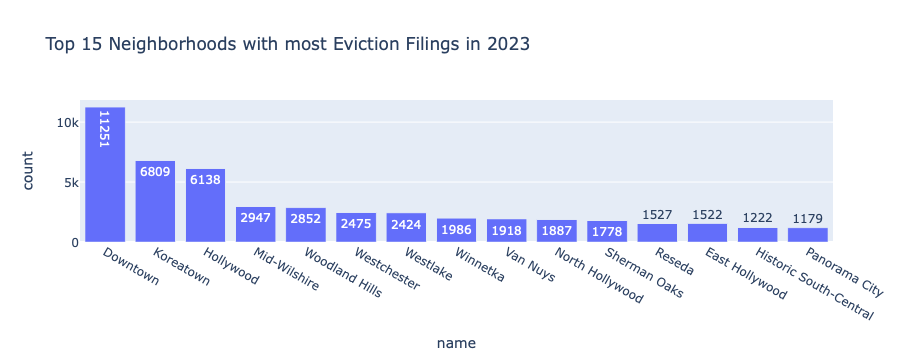

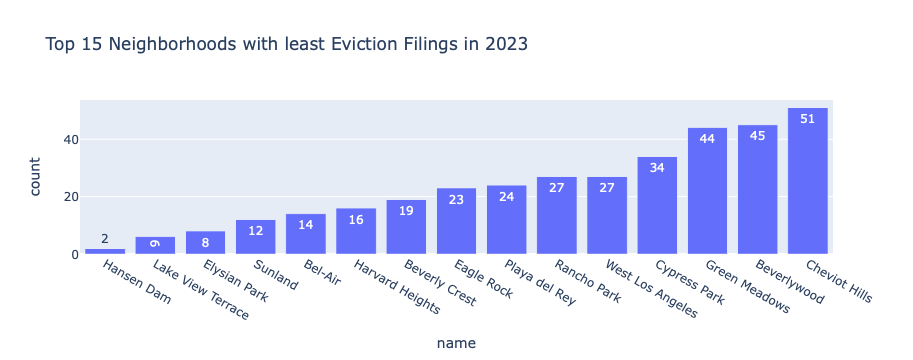

In [50]:
# I'm interested in seeing if there are particular buildings with high rates of evictions
fig_top = px.bar(
    neigh_top,
    x=neigh_top.index,
    y='count',
    title='Top 15 Neighborhoods with most Eviction Filings in 2023',
    text='count'
)
fig_bottom = px.bar(
    neigh_bottom,
    x=neigh_bottom.index,
    y='count',
    title='Top 15 Neighborhoods with least Eviction Filings in 2023',
    text='count'
)
fig_top.show()
fig_bottom.show()

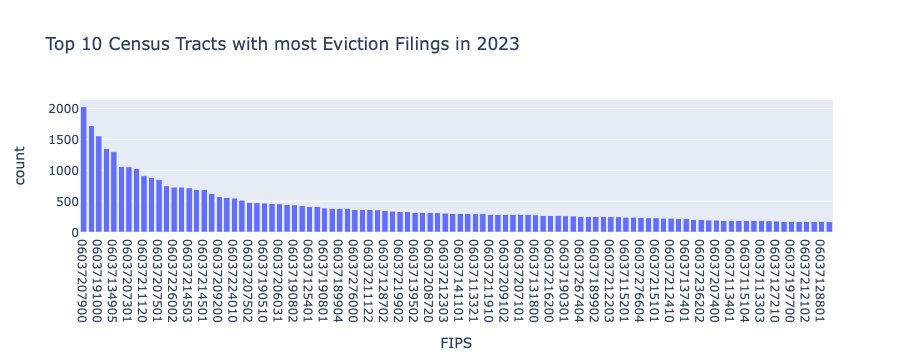

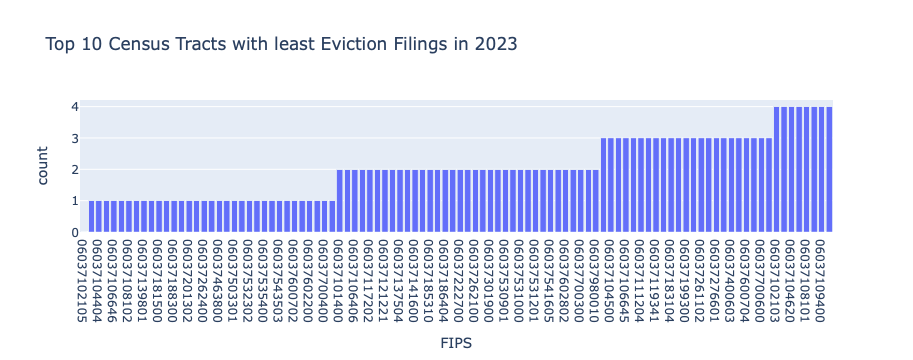

In [51]:
fig_top = px.bar(
    census_evic_counts_top,
    x='FIPS',
    y='count',
    title='Top 10 Census Tracts with most Eviction Filings in 2023',
    text='count'
)
fig_bottom = px.bar(
    census_evic_counts_bottom,
    x='FIPS',
    y='count',
    title='Top 10 Census Tracts with least Eviction Filings in 2023',
    text='count'
)
fig_top.show()
fig_bottom.show()